In [1]:
#Import all the required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


### Loading csv data

In [2]:
#Load the csv dataset as pandas dataframe
df = pd.read_csv('./Cars.csv')

In [3]:
#View the datsaet sample
df.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,Third Owner,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0


In [4]:
#Get the info about all fields and their datatypes
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8128 entries, 0 to 8127
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           8128 non-null   object 
 1   year           8128 non-null   int64  
 2   selling_price  8128 non-null   int64  
 3   km_driven      8128 non-null   int64  
 4   fuel           8128 non-null   object 
 5   seller_type    8128 non-null   object 
 6   transmission   8128 non-null   object 
 7   owner          8128 non-null   object 
 8   mileage        7907 non-null   object 
 9   engine         7907 non-null   object 
 10  max_power      7913 non-null   object 
 11  torque         7906 non-null   object 
 12  seats          7907 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 825.6+ KB


In [5]:
#List all the columns present in the dataset
df.columns

Index(['name', 'year', 'selling_price', 'km_driven', 'fuel', 'seller_type',
       'transmission', 'owner', 'mileage', 'engine', 'max_power', 'torque',
       'seats'],
      dtype='object')

### Preparing Data

In [6]:
# As per assignemnt map the catogorical values for owner into numerical (1-5)

def map_owner(df):
  '''
    Function to map the categotical value of 'owner' column into numerical labels '1-5'
    Input: dataframe
    Output: Dataframe with owner mapped owner column
  '''
  owners_list = list(df['owner'].unique())
  owner_mapping = {own:idx+1 for idx,own in enumerate(owners_list)}
  df = df.replace(owner_mapping)
  return df


df = map_owner(df)
df.head()

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,1,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,2,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Honda City 2017-2020 EXi,2006,158000,140000,Petrol,Individual,Manual,3,17.7 kmpl,1497 CC,78 bhp,"12.7@ 2,700(kgm@ rpm)",5.0
3,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,1,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
4,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,1,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0


In [7]:
#Check the unique values in fuel feature
df['fuel'].unique()

array(['Diesel', 'Petrol', 'LPG', 'CNG'], dtype=object)

In [8]:
#Remove all rows with CNG and LPG

lpg_rows  = df['fuel'] == 'LPG'
cng_rows  = df['fuel'] == 'CNG'
# # select all rows except the ones that contain 'LPG'
df = df[~lpg_rows]
# # select all rows except the ones that contain 'CNG'
df = df[~cng_rows]

df['fuel'].unique()

/tmp/ipykernel_140603/2376594372.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df = df[~cng_rows]


array(['Diesel', 'Petrol'], dtype=object)

In [9]:
#Function to convert the string value into float by striping the alphabetical
# characters and converting numerical value into float
def convert_float(str_value):
  if type(str_value) == str:
    return float(str_value.split()[0])
  else:
    return str_value

#Convert milage feature into float values by striping  'kmpl'
df['mileage'] = df['mileage'].apply(convert_float)
df['mileage'].info()


<class 'pandas.core.series.Series'>
Index: 8033 entries, 0 to 8127
Series name: mileage
Non-Null Count  Dtype  
--------------  -----  
7819 non-null   float64
dtypes: float64(1)
memory usage: 125.5 KB


In [10]:
#Convert engine feature into float values by striping 'cc'
df['engine'] = df['engine'].apply(convert_float)
df['engine'].info()


<class 'pandas.core.series.Series'>
Index: 8033 entries, 0 to 8127
Series name: engine
Non-Null Count  Dtype  
--------------  -----  
7819 non-null   float64
dtypes: float64(1)
memory usage: 125.5 KB


In [11]:
#Convert max_power feature into float values by striping 'bhp'
df['max_power'] = df['max_power'].apply(convert_float)
df['max_power'].info()

<class 'pandas.core.series.Series'>
Index: 8033 entries, 0 to 8127
Series name: max_power
Non-Null Count  Dtype  
--------------  -----  
7825 non-null   float64
dtypes: float64(1)
memory usage: 125.5 KB


In [12]:
#Remane the column from name to brand
df = df.rename(columns={"name": "brand"})

#Replace the feature 'name' with only its first word
df['brand'] = df['brand'].apply(lambda brand: brand.split()[0])
df['brand'].info()

<class 'pandas.core.series.Series'>
Index: 8033 entries, 0 to 8127
Series name: brand
Non-Null Count  Dtype 
--------------  ----- 
8033 non-null   object
dtypes: object(1)
memory usage: 125.5+ KB


In [13]:
#Drop the feature torque
df = df.drop('torque', axis=1)

In [14]:
#Remove the samples with the feature owner = "Test drive cars" whic after the mapping value becomes '5'

# Remove the data with owner type 'Test Drive' ie 5
test_drive_owner  = df['owner'] == 5
# select all rows except the ones that contain 'Test Drive Car' ie 5
df = df[~test_drive_owner]
df['owner'].unique()

array([1, 2, 3, 4])

In [15]:
df.head()

,brand,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti,2014,450000,145500,Diesel,Individual,Manual,1,23.40,1248.0,74.00,5.0
1,Skoda,2014,370000,120000,Diesel,Individual,Manual,2,21.14,1498.0,103.52,5.0
2,Honda,2006,158000,140000,Petrol,Individual,Manual,3,17.70,1497.0,78.00,5.0
3,Hyundai,2010,225000,127000,Diesel,Individual,Manual,1,23.00,1396.0,90.00,5.0
4,Maruti,2007,130000,120000,Petrol,Individual,Manual,1,16.10,1298.0,88.20,5.0


### Feature Engineering

In [16]:
'''Since the algorithm does not understands the temporal variable such as year
  and by simply putting it as int value will not help model to make sense
  or generalise, so the year feature is changed into age by the function calculate_car_age'''

import datetime

def calculate_car_age(year):
  #This function calculate the year value by subtraction it with current year and gives total age of the car
  year_built = datetime.date(year, 1, 1)
  year_now = datetime.date.today()
  age = (year_now - year_built).days//365
  return age



'''Since the algorithm does not understands the temporal variable such as year
  and by simply putting it as int value will not help model to make sense
  or generalise, so the year feature is changed into age by the function calculate_car_age'''

import datetime

def calculate_car_age(year):
  #This function calculate the year value by subtraction it with current year and gives total age of the car
  year_built = datetime.date(year, 1, 1)
  year_now = datetime.date.today()
  age = (year_now - year_built).days//365
  return age


#Finally the year column is renamed into age column with the value equals to toal age of car

#Rename column year into age
df.rename(columns = {'year':'age'}, inplace = True)

# Apply function calculate_car_age to every value of age column
df['age'] = df['age'].apply(calculate_car_age)


In [17]:
df.head()

,brand,age,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,Maruti,9,450000,145500,Diesel,Individual,Manual,1,23.40,1248.0,74.00,5.0
1,Skoda,9,370000,120000,Diesel,Individual,Manual,2,21.14,1498.0,103.52,5.0
2,Honda,17,158000,140000,Petrol,Individual,Manual,3,17.70,1497.0,78.00,5.0
3,Hyundai,13,225000,127000,Diesel,Individual,Manual,1,23.00,1396.0,90.00,5.0
4,Maruti,16,130000,120000,Petrol,Individual,Manual,1,16.10,1298.0,88.20,5.0


In [18]:
df.describe()

,age,selling_price,km_driven,owner,mileage,engine,max_power,seats
count,8028.000000,8.028000e+03,8.028000e+03,8028.000000,7814.000000,7814.000000,7820.000000,7814.000000
mean,9.184479,6.403937e+05,6.977314e+04,1.458022,19.391962,1462.914640,91.819726,5.421551
std,4.030836,8.027015e+05,5.664419e+04,0.715283,4.001972,504.759742,35.804513,0.963125
min,3.000000,2.999900e+04,1.000000e+03,1.000000,0.000000,624.000000,0.000000,2.000000
25%,6.000000,2.600000e+05,3.500000e+04,1.000000,16.780000,1197.000000,68.850000,5.000000
50%,8.000000,4.500000e+05,6.000000e+04,1.000000,19.300000,1248.000000,82.400000,5.000000
75%,12.000000,6.800000e+05,9.800000e+04,2.000000,22.320000,1582.000000,102.000000,5.000000
max,40.000000,1.000000e+07,2.360457e+06,4.000000,42.000000,3604.000000,400.000000,14.000000


### Univariate Analysis

##### Countplot

<Axes: xlabel='seller_type', ylabel='count'>

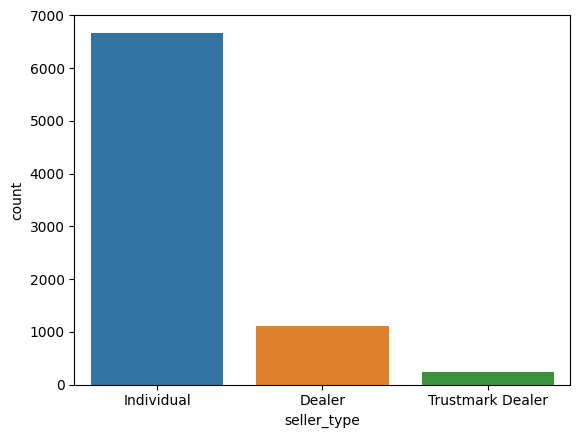

In [19]:
sns.countplot(data = df, x = 'seller_type')

##### Here the majority of seller type is individual seller

<Axes: xlabel='transmission', ylabel='count'>

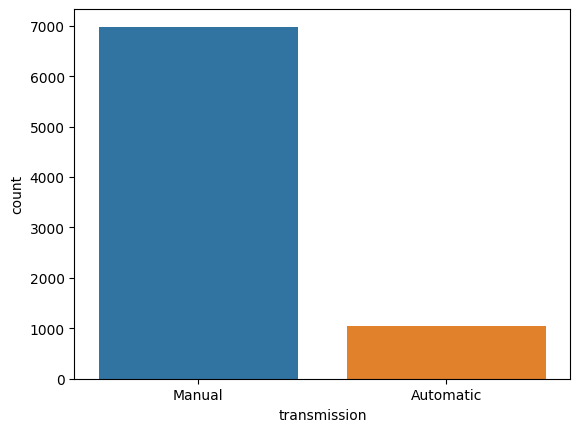

In [20]:
sns.countplot(data = df, x = 'transmission')

##### Here the majority of transmission type is manual

<Axes: xlabel='fuel', ylabel='count'>

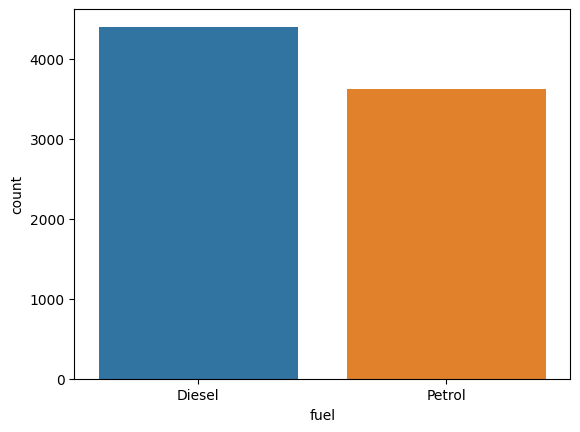

In [21]:
sns.countplot(data = df, x = 'fuel')

#### The dataset contains nearly equal no of cars with fuel type diesel and petrol

<Axes: xlabel='owner', ylabel='count'>

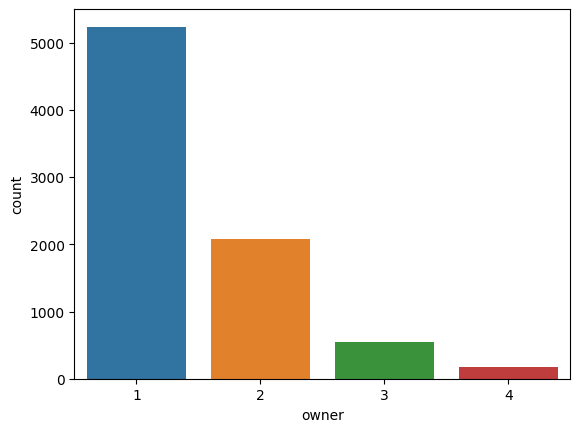

In [22]:
sns.countplot(data = df, x = 'owner')

##### First owners are in majority in the dataset

##### Distplot

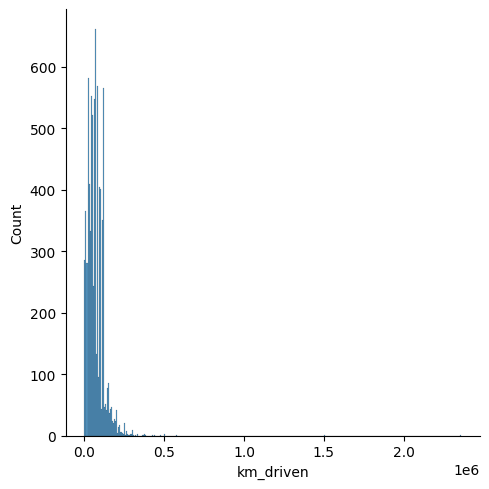

In [23]:
sns.displot(data = df, x = 'km_driven')

The majority distribution fall into the range 0-50000 KM and the distribution is right skewed

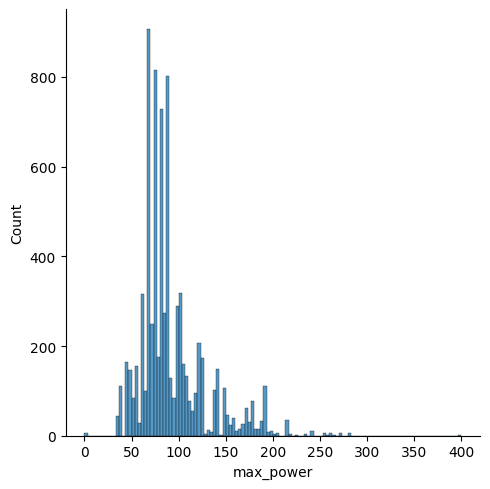

In [24]:
sns.displot(data = df, x = 'max_power')

##### The distribution for max power is also slightly right skewed

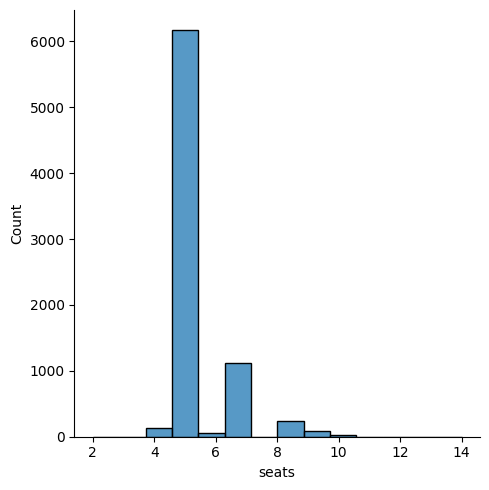

In [25]:
sns.displot(data = df, x = 'seats')

##### The dataset contains majority of 5 seater cars

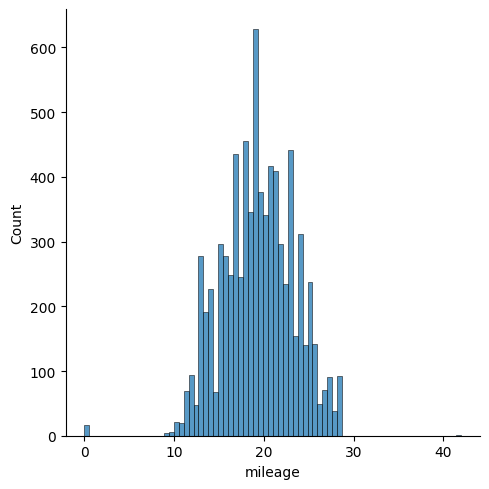

In [26]:
sns.displot(data = df, x = 'mileage')

##### The mileage is normally distributed

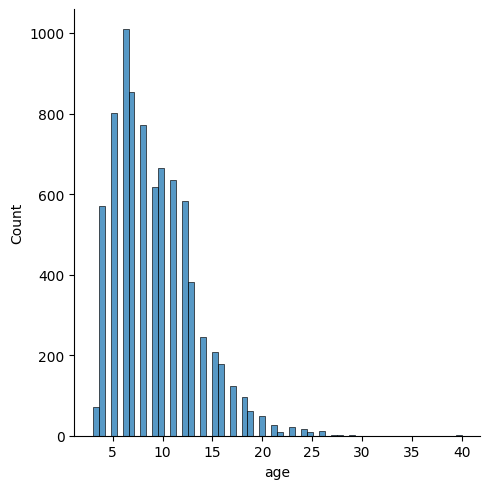

In [27]:
sns.displot(data = df, x = 'age')

### Multivariate analysis

##### Boxplot

Text(0.5, 0, 'Fuel')

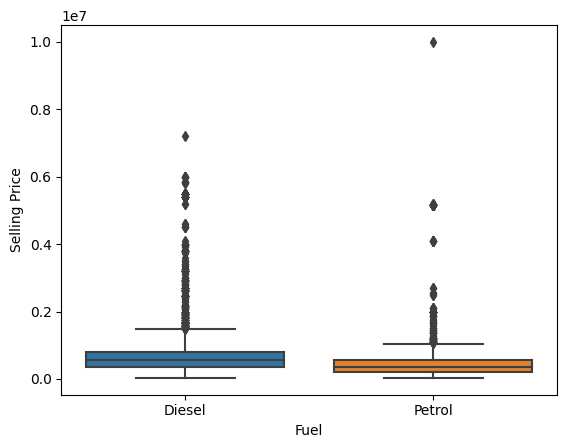

In [28]:
# Box plot on "Fuel"
sns.boxplot(x = df["fuel"], y = df["selling_price"]);
plt.ylabel("Selling Price")
plt.xlabel("Fuel")

Text(0.5, 0, 'Transmission')

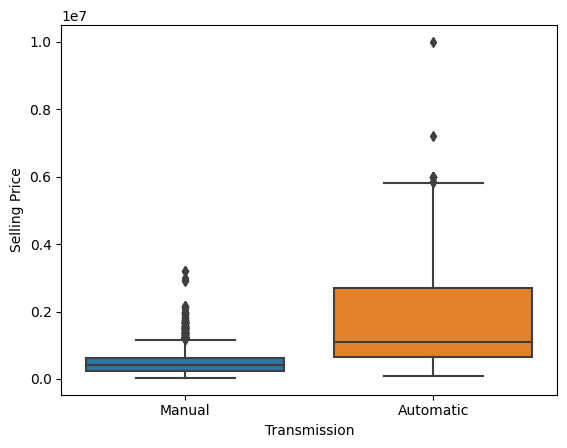

In [29]:
# Box plot on "Transmission"
sns.boxplot(x = df["transmission"], y = df["selling_price"]);
plt.ylabel("Selling Price")
plt.xlabel("Transmission")

Text(0.5, 0, 'Seller Ty')

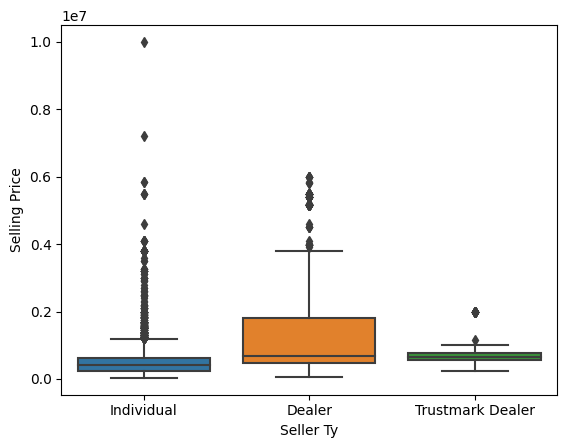

In [30]:
# Box plot on "seller_type"
sns.boxplot(x = df["seller_type"], y = df["selling_price"]);
plt.ylabel("Selling Price")
plt.xlabel("Seller Ty")

Text(0.5, 0, 'Owner')

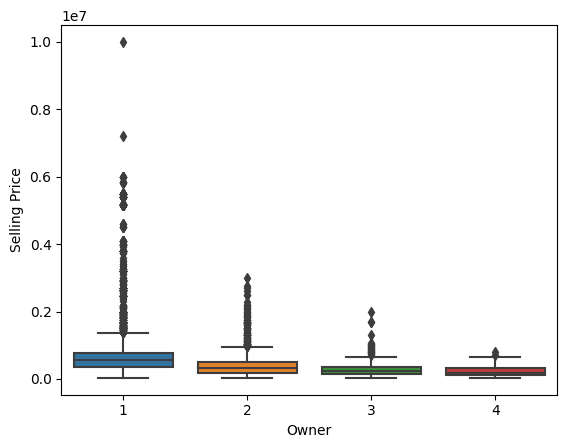

In [31]:
# Box plot on "owner"
sns.boxplot(x = df["owner"], y = df["selling_price"]);
plt.ylabel("Selling Price")
plt.xlabel("Owner")

### Scatter Plot

<Axes: xlabel='max_power', ylabel='selling_price'>

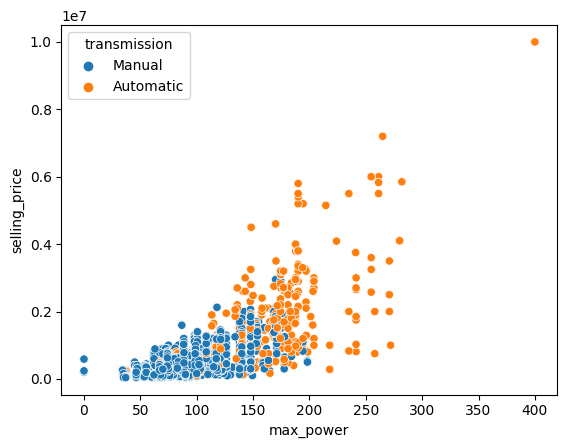

In [32]:
sns.scatterplot(x = df['max_power'], y = df['selling_price'], hue=df['transmission'])

##### The plot shows positive correlation as the max_power increases the selling price also increase



<Axes: xlabel='age', ylabel='selling_price'>

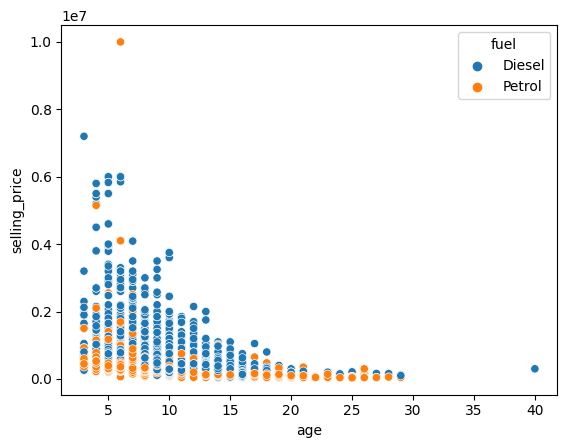

In [33]:
sns.scatterplot(x = df['age'], y = df['selling_price'], hue=df['fuel'])

##### The plot shows negative correlation as the age increases the selling price decrease

<Axes: xlabel='km_driven', ylabel='age'>

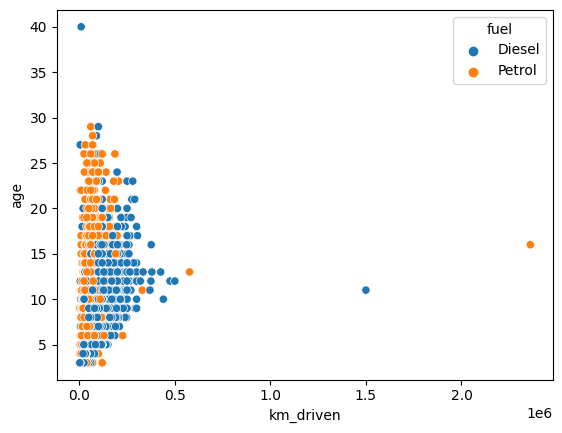

In [34]:
sns.scatterplot(x = df['km_driven'], y = df['age'], hue=df['fuel'])

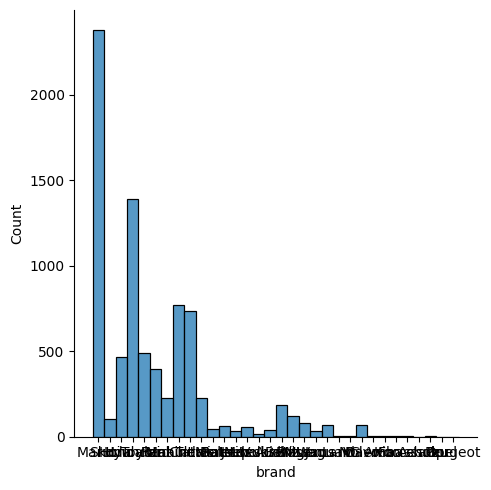

In [35]:
sns.displot(data = df, x = 'brand')

In [36]:
#Since there large variation in brand let's drop this
df = df.drop('brand', axis=1)

In [37]:
# sns.heatmap(df.corr(), annot=True, cmap = 'magma')

### Lable Encoding Categorical Features

In [38]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df["fuel"] = le.fit_transform(df["fuel"])
df["seller_type"] = le.fit_transform(df["seller_type"])
df["transmission"] = le.fit_transform(df["transmission"])
df["owner"] = le.fit_transform(df["owner"])

In [39]:
df.head()

,age,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,seats
0,9,450000,145500,0,1,1,0,23.40,1248.0,74.00,5.0
1,9,370000,120000,0,1,1,1,21.14,1498.0,103.52,5.0
2,17,158000,140000,1,1,1,2,17.70,1497.0,78.00,5.0
3,13,225000,127000,0,1,1,0,23.00,1396.0,90.00,5.0
4,16,130000,120000,1,1,1,0,16.10,1298.0,88.20,5.0


### Feature selection

In [40]:
#With the help of above analysis the below most relevant features were identified

X = df[['age', 'mileage', 'engine', 'max_power']]
y = df['selling_price']

### Train test split

In [41]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42)

In [42]:
X_train

,age,mileage,engine,max_power
6853,8,13.58,2499.0,72.40
1495,10,15.96,2523.0,62.10
7904,10,20.77,1248.0,88.76
1281,13,18.80,1248.0,90.00
1421,13,23.00,1396.0,90.00
...,...,...,...,...
5293,10,20.36,1197.0,78.90
5461,7,20.51,998.0,67.04
865,8,20.77,1248.0,88.76
7701,4,22.37,2487.0,214.56


In [43]:
print(X_train['mileage'].median())
print(X_train['engine'].median())
print(X_train['max_power'].median())

19.33
1248.0
82.4


### Preprocessing

###### Null Values

In [44]:
#check for null values in training features
X_train.isna().sum()

age            0
mileage      154
engine       154
max_power    149
dtype: int64

In [45]:
#Handle missing values in training features by replacing it with the medium values
X_train.fillna(X_train.median(), inplace = True)

In [46]:

#confirming the missing value is handled
X_train.isna().sum()

age          0
mileage      0
engine       0
max_power    0
dtype: int64

In [47]:
#Doing the same with test data
X_test.fillna(X_test.median(), inplace = True)
X_test.isna().sum()

age          0
mileage      0
engine       0
max_power    0
dtype: int64

In [48]:
#check for missiing values in label
print(y_train.isna().sum())
print(y_test.isna().sum())

0
0


##### Borrowed the code from Regression Analysis
https://github.com/chaklam-silpasuwanchai/Machine-Learning/blob/main/00%20-%20Case%20Study/01%20-%20Case%20Study%20-%20Regression.ipynb]

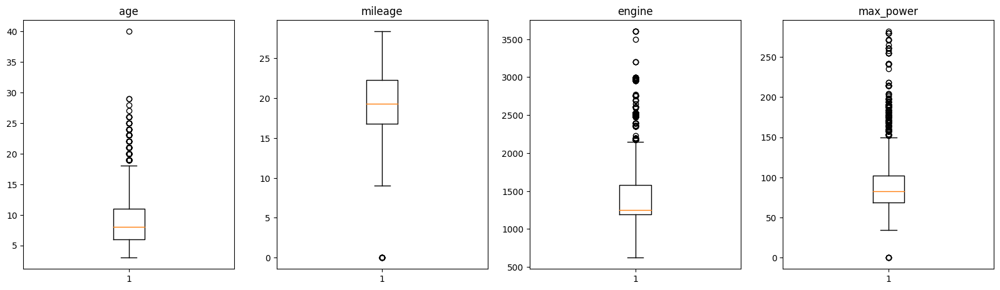

In [49]:
# Detect outliers in each variable using box plots.
plt.figure(figsize=(20,30))

for i,col in enumerate(list(X_train.columns)):
  plt.subplot(5,4,i+1)
  plt.boxplot(X_train[col])
  plt.title(col)



# for variable,i in col_dict.items():
#                      plt.subplot(5,4,i)
#                      plt.boxplot(X_train[variable])
#                      plt.title(variable)

plt.show()

In [50]:
def outlier_count(col, data =X_train):
    # calculate your 25% quatile and 75% quatile
    q75, q25 = np.percentile(data[col], [75, 25])
    # calculate your inter quatile
    iqr = q75 - q25
    # min_val and max_val
    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    # count number of outliers, which are the data that are less than min_val or more than max_val calculated above
    outlier_count = len(np.where((data[col] > max_val) | (data[col] < min_val))[0])
    # calculate the percentage of the outliers
    outlier_percent = round(outlier_count/len(data[col])*100, 2)
    if(outlier_count > 0):
        print("\n"+15*'-' + col + 15*'-'+"\n")
        print('Number of outliers: {}'.format(outlier_count))
        print('Percent of data that is outlier: {}%'.format(outlier_percent))

In [51]:
for col in X_train.columns:
    outlier_count(col)


---------------age---------------

Number of outliers: 145
Percent of data that is outlier: 2.58%

---------------mileage---------------

Number of outliers: 14
Percent of data that is outlier: 0.25%

---------------engine---------------

Number of outliers: 836
Percent of data that is outlier: 14.88%

---------------max_power---------------

Number of outliers: 409
Percent of data that is outlier: 7.28%


##### We can see from the above results that "seller_type", "transmission", "engine" and "seats" have very high outlier percentage

In [52]:
#Feature Scaling is performed to get the uniform feature value range across all the features

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test  = scaler.transform(X_test)



In [53]:
X_train[33]

array([ 2.46623062, -1.51773742,  0.67281715,  0.93753587])

In [54]:
y_train[33]

730000

In [55]:
#Shape of all the features and label of training and test data
print("Shape of X_train: ", X_train.shape)
print("Shape of X_test: ", X_test.shape)
print("Shape of y_train: ", y_train.shape)
print("Shape of y_test: ", y_test.shape)

Shape of X_train:  (5619, 4)
Shape of X_test:  (2409, 4)
Shape of y_train:  (5619,)
Shape of y_test:  (2409,)


In [177]:
#Test Using Linear Regression Model
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

lr = LinearRegression()
print(lr)
lr.fit(X_train, y_train)
print(lr)
yhat = lr.predict(X_test)

print("MSE: ", mean_squared_error(y_test, yhat))
print("r2: ", r2_score(y_test, yhat))

LinearRegression()
LinearRegression()
MSE:  245542437477.8089
r2:  0.6325711089406074


In [178]:
import pickle
filename = './car-price.model'
pickle.dump(lr, open(filename, 'wb'))

In [142]:
lr.predict([np.array([12, 60, 800, 78])])

array([32171815.65578177])

In [134]:
#Test Using Ramdom Forest Regression Model
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=12, bootstrap=True)
rf.fit(X_train, y_train)
yhat = rf.predict(X_test)

print("MSE: ", mean_squared_error(y_test, yhat))
print("r2: ", r2_score(y_test, yhat))

MSE:  33162452990.46059
r2:  0.950375815063759


In [139]:
result = rf.predict([np.array([12, 80, 800, 78])])
resultimport pickle
import datetime

array([1002083.33333333])

### Fitting the training data with various regression algorithms with cross validation to find out the best model.

In [58]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

# Libraries for model evaluation

# Various Regression algorithms
algorithms = [LinearRegression(), SVR(), KNeighborsRegressor(), DecisionTreeRegressor(random_state = 0),
              RandomForestRegressor(n_estimators = 100, random_state = 0)]

# Corresponding algorithms name
algo_names = ["Linear Regression", "SVR", "KNeighbors Regressor", "Decision-Tree Regressor", "Random-Forest Regressor"]

In [59]:
from sklearn.model_selection import KFold, cross_val_score

#defining splits
kfold = KFold(n_splits=5, shuffle=True)

for i, model in enumerate(algorithms):
    scores = cross_val_score(model, X_train, y_train, cv=kfold, scoring='neg_mean_squared_error')
    print(f"{algo_names[i]} - Score: {scores}; Mean: {scores.mean()}")

Linear Regression - Score: [-2.06400193e+11 -2.43804527e+11 -2.56941071e+11 -2.28925025e+11
 -2.48803277e+11]; Mean: -236974818799.85776
SVR - Score: [-6.67802564e+11 -7.67208464e+11 -7.40714041e+11 -5.63029882e+11
 -6.12907258e+11]; Mean: -670332442025.9733
KNeighbors Regressor - Score: [-2.54204786e+10 -4.93286590e+10 -3.18402265e+10 -2.69721929e+10
 -3.52309842e+10]; Mean: -33758508261.183815
Decision-Tree Regressor - Score: [-2.27702246e+10 -2.93762275e+10 -2.20976879e+10 -2.68603668e+10
 -2.07876822e+10]; Mean: -24378437811.66531
Random-Forest Regressor - Score: [-2.56762428e+10 -1.56654280e+10 -3.11694803e+10 -1.93547779e+10
 -3.14761937e+10]; Mean: -24668424515.561386


##### Since the random forest regressor has lowest mean of negetive mean square error we will perform the cross validation and gridsearch with various parameters in RandomForestRegressor

In [103]:
from sklearn.model_selection import GridSearchCV

param_grid = {'bootstrap': [True], 'max_depth': [5, 10, None],
              'n_estimators': [5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 20]}

rf = RandomForestRegressor(random_state = 1)

grid = GridSearchCV(estimator = rf,
                    param_grid = param_grid,
                    cv = kfold,
                    n_jobs = -1,
                    return_train_score=True,
                    refit=True,)

# Fit your grid_search
grid.fit(X_train, y_train);  #fit means start looping all the possible parameters

In [104]:
grid.best_params_

{'bootstrap': True, 'max_depth': None, 'n_estimators': 20}

In [105]:
best_mse = grid.best_score_

In [106]:
best_mse

0.9690323632858826

In [148]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.datasets import make_regression
# >>> X, y = make_regression(n_features=4, n_informative=2,
# ...                        random_state=0, shuffle=False)
regr = RandomForestRegressor(max_depth=2, random_state=0)
regr.fit(X_train, y_train)
# RandomForestRegressor(...)
print(regr.predict([[10, 20, 800, 65]]))

[2178412.11737029]


In [155]:
# Fitting Random Forest Regression to the dataset
# import the regressor
from sklearn.ensemble import RandomForestRegressor
 
# create regressor object
regressor = RandomForestRegressor(n_estimators=12,
                                  random_state=0)
 
# fit the regressor with x and y data
regressor.fit(X_train, y_train)

RandomForestRegressor(n_estimators=12, random_state=0)

In [158]:
regressor.predict([[13, 20, 800, 65]])

array([1089583.33333333])

In [159]:
#### Now we train the RandomForest Model with best parameters
best_model = RandomForestRegressor()
best_rf.fit(X_train, y_train)
ypred = best_rf.predict(X_test)

print("r2: ", r2_score(y_test, ypred))

r2:  0.9610183639667778


In [165]:
best_rf.predict([np.array([50, 60, 110, 300])])

array([1247500.])

In [99]:
#Test Using Ramdom Forest Regression Model
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor(n_estimators=200, bootstrap=True)
rf.fit(X_train, y_train)
yhat = rf.predict(X_test)

print("MSE: ", mean_squared_error(y_test, yhat))
print("r2: ", r2_score(y_test, yhat))

MSE:  29392823866.066788
r2:  0.9560166756136035


In [102]:
rf.predict([np.array([15, 80, 800, 78])])

array([1189625.])

##### This is the final R2 score for the best model

### Testing

In [84]:
#Calculate the R2 score on the test dataset
from sklearn.metrics import mean_squared_error, r2_score
ypred = grid.predict(X_test)
r2_score(y_test, yhat)

-0.051901051579303914

#####  Feature Importance

##### Know how much the model has given importance for each selected feature

In [85]:
#stored in this variable
#note that grid here is random forest
best_rf = grid.best_estimator_
best_rf.feature_importances_

array([0.21384452, 0.02260196, 0.03704496, 0.72650857])

Text(0.5, 0, 'Random Forest Feature Importance')

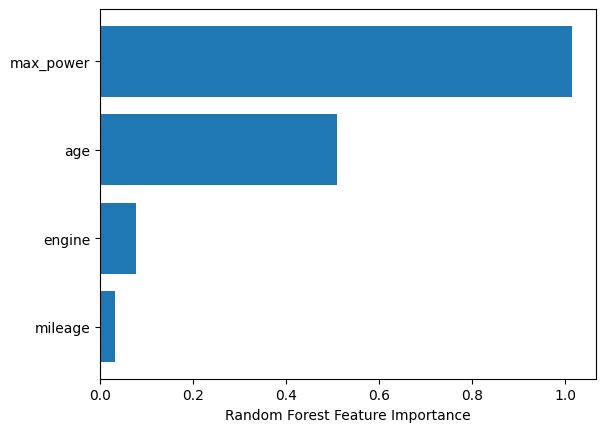

In [86]:
from sklearn.inspection import permutation_importance

perm_importance = permutation_importance(best_rf, X_test, y_test)

#let's plot
sorted_idx = perm_importance.importances_mean.argsort()
plt.barh(X.columns[sorted_idx], perm_importance.importances_mean[sorted_idx])
plt.xlabel("Random Forest Feature Importance")

### Save the best model in the into model file

In [87]:
# import pickle
# filename = 'app/model/car-price.model'
# pickle.dump(best_rf, open(filename, 'wb'))

In [88]:
best_rf.predict([np.array([16, 80, 800, 78])])

array([1257668.75])

## Summary

## Data Preparation:

##### Data Processing was done according to the requirement provided in the assignment. The unnecessary columns were pruned. Various tranformation on various columns to get the final dataframe.

## EDA:
##### EDA was performed on the processed dataset. With the help of various analysis such as distribution plot, box plot, scatter plot, the attibutes of the various features were analysed.

## Feature Selection:
##### With the help of EDA performed on the data, most relevent features were selected. The selected features were:
- Age
* Mileage
+ Engine
- Max Power
##### With label Selling Price

## Preprocessing:

##### The categorical features were converted into numerical features with label encoder

##### After selecting the relevant features the data was seperated as training and testing. 70% was used for training and remaining 30% was used for testig purpose.

##### The training and testing  set of features and label was checked if those contained null value. The features that contained the null value were filled with the midean of their distribution.

#### Finally to make the training dataset uniform the training features were normalized using StandartScalar.

## The data was finally ready for training with various Regressing algorithms.

#### Training Data(features and label) was finally fitted with various Regression Algorithms. The algorithms used were:
- Linear Regression
- SVR
- KNeighbors Regressor
- Decision-Tree Regressor
- Random-Forest Regressor

Out of all, Random-Forest Regressor performed the best on the training data. So the Random forest regression with cross-validation on various parameters was trained using GridSearch.

### Finally the model was tested on test data and the model was saved to the file using pickle.




## Final Comments

### The model still has very high Mean Square Error, so it can be further improved using various upcoming techniques like, Regularization etc.



## Assignment 2

In [69]:
#experiment tracking
import mlflow
import os
# This the dockerized method.
# We build two docker containers, one for python/jupyter and another for mlflow.
# The url `mlflow` is resolved into another container within the same composer.
mlflow.set_tracking_uri("http://127.0.0.1:5000")
# In the dockerized way, the user who runs this code will be `root`.
# The MLflow will also log the run user_id as `root`.
# To change that, we need to set this environ["LOGNAME"] to your name.
os.environ["LOGNAME"] = "nitesh"
mlflow.create_experiment(name="model_comparision")  #create if you haven't create
mlflow.set_experiment(experiment_name="nitesh-car-model-comparision")


2023/09/12 15:56:10 INFO mlflow.tracking.fluent: Experiment with name 'nitesh-car-model-comparision' does not exist. Creating a new experiment.


<Experiment: artifact_location='mlflow-artifacts:/458442085332149034', creation_time=1694513470731, experiment_id='458442085332149034', last_update_time=1694513470731, lifecycle_stage='active', name='nitesh-car-model-comparision', tags={}>

##### Task 1

##### Function to compute R2

In [70]:
def compute_r2(y_true, y_pred):
    ssr = np.sum((y_true - y_pred) ** 2)
    sst = np.sum((y_true - np.mean(y_true)) ** 2)
    r2 = 1 - (ssr / sst)
    return r2

### Linear Regression Class

##### Changes made from original class 

- Added method to initialze weight (zero , Xavier) ==> "initialize"
- Added method to calculate the  gradients with or without momentum ==> apply_momentum
- Added method to plot the features according to their co_efficients ==> plot_feature_importance

In [71]:
from sklearn.model_selection import KFold
import math
import random

import warnings
warnings.filterwarnings("ignore")

class LinearRegression(object):
    
    #in this class, we add cross validation as well for some spicy code....
    kfold = KFold(n_splits=3)
            
    def __init__(self, regularization, lr=0.001, method='batch', weight_init='zero', momentum = False, num_epochs=500, batch_size=50, cv=kfold):
        self.lr         = lr
        self.num_epochs = num_epochs
        self.batch_size = batch_size
        self.method     = method
        self.cv         = cv
        self.weight_init = weight_init
        self.momentum = momentum
        self.regularization = regularization
        

    def mse(self, ytrue, ypred):
        return np.mean(((ypred - ytrue) ** 2))#.sum() / ytrue.shape[0]
    
    def fit(self, X_train, y_train):
            
        #create a list of kfold scores
        self.kfold_scores = list()
        
        #reset val loss
        self.val_loss_old = np.infty

        print("Training shape is",X_train.shape)

        #kfold.split in the sklearn.....
        #5 splits
        for fold, (train_idx, val_idx) in enumerate(self.cv.split(X_train)):
            
            X_cross_train = X_train[train_idx]
            y_cross_train = y_train[train_idx]
            X_cross_val   = X_train[val_idx]
            y_cross_val   = y_train[val_idx]
            
            self.theta = np.zeros(X_cross_train.shape[1])
            
            #define X_cross_train as only a subset of the data
            #how big is this subset?  => mini-batch size ==> 50
            
            #one epoch will exhaust the WHOLE training set
            with mlflow.start_run(run_name=f"Fold-{fold}", nested=True):
                
                params = {"method": self.method, 'weight_init':self.weight_init, "lr": self.lr, "reg": type(self).__name__}
                mlflow.log_params(params=params)
                
                for epoch in range(self.num_epochs):
                
                    #with replacement or no replacement
                    #with replacement means just randomize
                    #with no replacement means 0:50, 51:100, 101:150, ......300:323
                    #shuffle your index
                    perm = np.random.permutation(X_cross_train.shape[0])
                            
                    X_cross_train = X_cross_train[perm]
                    y_cross_train = y_cross_train[perm]
                    
                    if self.method == 'sto':
                        for batch_idx in range(X_cross_train.shape[0]):
                            X_method_train = X_cross_train[batch_idx].reshape(1, -1) #(11,) ==> (1, 11) ==> (m, n)
                            y_method_train = y_cross_train[batch_idx]
                            train_loss = self._train(X_method_train, y_method_train)
                    elif self.method == 'mini':
                        for batch_idx in range(0, X_cross_train.shape[0], self.batch_size):
                            X_method_train = X_cross_train[batch_idx:batch_idx+self.batch_size, :]
                            y_method_train = y_cross_train[batch_idx:batch_idx+self.batch_size]
                            train_loss = self._train(X_method_train, y_method_train)
                    else:
                        X_method_train = X_cross_train
                        y_method_train = y_cross_train
                        train_loss = self._train(X_method_train, y_method_train)

                    mlflow.log_metric(key="train_loss", value=train_loss, step=epoch)

                    yhat_val = self.predict(X_cross_val)
                    val_loss_new = self.mse(y_cross_val, yhat_val)
                    mlflow.log_metric(key="val_loss", value=val_loss_new, step=epoch)
                    
                    #record dataset
                    mlflow_train_data = mlflow.data.from_numpy(features=X_method_train, targets=y_method_train)
                    mlflow.log_input(mlflow_train_data, context="training")
                    
                    mlflow_val_data = mlflow.data.from_numpy(features=X_cross_val, targets=y_cross_val)
                    mlflow.log_input(mlflow_val_data, context="validation")
                    
                    #early stopping
                    if np.allclose(val_loss_new, self.val_loss_old):
                        break
                    self.val_loss_old = val_loss_new
            
                self.kfold_scores.append(val_loss_new)
                print(f"Fold {fold}: {val_loss_new}")
            
                    
    def _train(self, X, y):
        yhat = self.predict(X)
        m    = X.shape[0]
        if self.weight_init == 'xavier':
            m = self.initialize(m)  
        grad = (1/m) * X.T @(yhat - y) + self.regularization.derivation(self.theta)
        if self.momentum is True:
            self.theta = self.apply_momentum(grad)
        else:
            self.theta = self.theta - self.lr * grad
        return self.mse(y, yhat)
    
    def initialize(self, m):
        #This is the added method to initialized the weight with Xavier method
        lower, upper = -(1.0 / math.sqrt(m)), (1.0 / math.sqrt(m))
        numbers = random.randint(1, 1000)
        scaled = lower + numbers * (upper  - lower)
        return scaled


    def apply_momentum(self, gradient, momentum=0.9):
        # This is the added method apply the momentum while training and conversing the gradient
        velocity = np.zeros(X_train.shape[1])
        velocity = momentum * velocity + self.lr  * gradient  
        self.theta -= velocity
        return self.theta


    def predict(self, X):
        return X @ self.theta  #===>(m, n) @ (n, )
    
    def _coef(self):
        return self.theta[1:]  #remind that theta is (w0, w1, w2, w3, w4.....wn)
                               #w0 is the bias or the intercept
                               #w1....wn are the weights / coefficients / theta
    
    def plot_feature_importance(self, features_names):
        # This is the added method to plot the models feature improtance according to coefficient
        if features_names is None:
            raise ValueError("Fit the model before plotting feature importance.")
        # Get the coefficients of the features
        coefficients = self.theta
        scaler = StandardScaler()
        scaler.fit(X_train)
        coefficients = scaler.transform([coefficients])
        # Create a bar plot to visualize feature importance
        plt.figure(figsize=(10, 6))
        plt.bar(features_names, coefficients[0])
        plt.xlabel('Coefficient Value')
        plt.ylabel('Feature')
        plt.title('Feature Importance based on Coefficients')
        plt.show()
    
    def _bias(self):
        return self.theta[0]

In [72]:
class LassoPenalty:
    
    def __init__(self, l):
        self.l = l # lambda value
        
    def __call__(self, theta): #__call__ allows us to call class as method
        print("This is theta", theta)
        return self.l * np.sum(np.abs(theta))
        
    def derivation(self, theta):
        return self.l * np.sign(theta)
    
class RidgePenalty:
    
    def __init__(self, l):
        self.l = l
        
    def __call__(self, theta): #__call__ allows us to call class as method
        return self.l * np.sum(np.square(theta))
        
    def derivation(self, theta):
        return self.l * 2 * theta
    
class ElasticPenalty:
    
    def __init__(self, l = 0.1, l_ratio = 0.5):
        self.l = l 
        self.l_ratio = l_ratio

    def __call__(self, theta):  #__call__ allows us to call class as method
        l1_contribution = self.l_ratio * self.l * np.sum(np.abs(theta))
        l2_contribution = (1 - self.l_ratio) * self.l * 0.5 * np.sum(np.square(theta))
        return (l1_contribution + l2_contribution)

    def derivation(self, theta):
        l1_derivation = self.l * self.l_ratio * np.sign(theta)
        l2_derivation = self.l * (1 - self.l_ratio) * theta
        return (l1_derivation + l2_derivation)
    
class Lasso(LinearRegression):
    
    def __init__(self, method, weight_init, momentum, lr, l):
        self.regularization = LassoPenalty(l)
        super().__init__(self.regularization, lr, method, weight_init, momentum)
        
class Ridge(LinearRegression):
    
    def __init__(self, method, weight_init, momentum,  lr, l):
        self.regularization = RidgePenalty(l)
        super().__init__(self.regularization, lr, method, weight_init, momentum)
        
class ElasticNet(LinearRegression):
    
    def __init__(self, method, weight_init, momentum, lr, l, l_ratio=0.5):
        self.regularization = ElasticPenalty(l, l_ratio)
        super().__init__(self.regularization, lr, method, weight_init, momentum)


In [73]:
#helper function for looping classnames
import sys

def str_to_class(classname):
    return getattr(sys.modules[__name__], classname)

In [74]:
#Convert y_train from series to numpy array
y_train = np.array(y_train).astype(int)

##### Task 2

In [280]:
results = []
models = ["Ridge", "Lasso", "ElasticNet"]
momentum = [True, False]
batch_size = ['sto', 'mini', 'batch']
weight_init = ['xavier', 'zero']
learning_rate = [0.01, 0.001, 0.0001]

for model in models:
    type_of_regression = str_to_class(model)    
    for moment in momentum:
        for batch in batch_size:
            for wt in weight_init:
                for lr in learning_rate:
                    params = {"method": batch, 'weight_init':wt, "momentum":moment, "lr": lr, "l": 0.1}
                    mlflow.start_run(run_name=f"method-{params['method']}-weight_init-{params['weight_init']}-momentum-{params['momentum']}-lr-{params['lr']}-reg-{model}", nested=True)
                    print("="*5, model, '===',wt, '===', moment, '===', batch, '===',lr,"="*5)
                    # #######
                    model = type_of_regression(**params)  
                    model.fit(X_train, y_train)
                    yhat = model.predict(X_test)
                    mse  = model.mse(yhat, y_test)
                    r2 = compute_r2(yhat, y_test)
                    print("Test MSE: ", mse)
                    print("Test R2: ", r2)
                    result = {"model":model, "params": params, "MSE": mse, "R2":r2}
                    results.append(result)
                    mlflow.log_metric(key="test_mse", value=mse)
                    signature = mlflow.models.infer_signature(X_train, model.predict(X_train))
                    mlflow.sklearn.log_model(model, artifact_path='model', signature=signature)
                    # #######
                    mlflow.end_run()

2023/09/12 11:44:29 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


2023/09/12 11:44:29 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:44:29 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== Ridge === xavier === True === sto === 0.01 =====
Training shape is (5619, 4)


2023/09/12 11:44:29 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:44:29 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:44:29 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 1048500029699.1635


2023/09/12 11:44:57 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:44:57 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:44:57 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 1013027591809.5594


2023/09/12 11:45:11 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:45:11 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:45:11 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 992178390841.4717
Test MSE:  1057761777457.6633
Test R2:  -4884.914601528663


2023/09/12 11:45:28 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:45:28 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:45:28 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Ridge object at 0x7fbf76da4100> === xavier === True === sto === 0.001 =====
Training shape is (5619, 4)


2023/09/12 11:45:28 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:45:28 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:45:28 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 1077221241367.0833


2023/09/12 11:45:38 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:45:38 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:45:38 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 1008135792186.9052


2023/09/12 11:46:07 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:07 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:07 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 988984374797.8644
Test MSE:  1054544136274.7463
Test R2:  -3438.7103194014067


2023/09/12 11:46:19 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:19 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:19 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Ridge object at 0x7fbf86587ca0> === xavier === True === sto === 0.0001 =====
Training shape is (5619, 4)


2023/09/12 11:46:19 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:19 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:19 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 1075376295592.8708


2023/09/12 11:46:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:26 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 1004782715762.7328


2023/09/12 11:46:50 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:50 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:50 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 985810798074.616
Test MSE:  1051319439750.8883
Test R2:  -2535.4545515278473


2023/09/12 11:46:55 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:55 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:55 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Ridge object at 0x7fbf87387850> === zero === True === sto === 0.01 =====
Training shape is (5619, 4)


2023/09/12 11:46:55 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:55 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:46:55 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 689498537682.656


2023/09/12 11:47:24 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:47:24 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:47:24 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 666956202192.4869


2023/09/12 11:47:53 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:47:53 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:47:54 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 674706059141.8163
Test MSE:  732528551781.1125
Test R2:  -3.2164403775045267


2023/09/12 11:48:25 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:48:25 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:48:25 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Ridge object at 0x7fbf76bcd330> === zero === True === sto === 0.001 =====
Training shape is (5619, 4)


2023/09/12 11:48:25 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:48:25 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:48:25 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 692811148093.3053


2023/09/12 11:48:55 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:48:55 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:48:55 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 652676504521.9429


2023/09/12 11:49:25 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:49:25 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:49:25 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 635805933363.8837
Test MSE:  690331875154.6349
Test R2:  -1.1366324682935214


2023/09/12 11:49:30 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:49:31 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:49:31 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Ridge object at 0x7fbf87a090c0> === zero === True === sto === 0.0001 =====
Training shape is (5619, 4)


2023/09/12 11:49:31 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:49:31 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:49:31 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 698243810813.9072


2023/09/12 11:49:40 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:49:40 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:49:40 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 649264403965.5513


2023/09/12 11:49:47 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:49:47 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:49:47 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 634844750055.3278
Test MSE:  690976185372.8604
Test R2:  -1.2642957880089019
===== <__main__.Ridge object at 0x7fbf97bac9a0> === xavier === True === mini === 0.01 =====
Training shape is (5619, 4)
Fold 0: 705044048561.1241
Fold 1: 696758126999.861
Fold 2: 710142978432.5951
Test MSE:  765527522386.6704
Test R2:  -4.47067815070742
===== <__main__.Ridge object at 0x7fbf7760a770> === xavier === True === mini === 0.001 =====
Training shape is (5619, 4)
Fold 0: 692393987705.2816
Fold 1: 643540519574.8918
Fold 2: 631302636888.5997
Test MSE:  686939063152.4625
Test R2:  -0.899215275605832
===== <__main__.Ridge object at 0x7fbf87046500> === xavier === True === mini === 0.0001 =====
Training shape is (5619, 4)
Fold 0: 715597582564.0856
Fold 1: 661912918429.2346
Fold 2: 655870202497.0929
Test MSE:  715447523577.967
Test R2:  -1.7680992896129357
===== <__main__.Ridge object at 0x7fbf872e50f0> === zero === True === mini === 0.01 =====
Training shape is (5619, 4)
Fold 0: 698122606638.3739
Fo

2023/09/12 11:54:05 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:54:05 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:54:05 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Ridge object at 0x7fbf979f8c70> === xavier === False === sto === 0.01 =====
Training shape is (5619, 4)


2023/09/12 11:54:05 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:54:06 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:54:06 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 1084345171797.803


2023/09/12 11:54:33 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:54:33 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:54:33 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 1006082723094.8038


2023/09/12 11:54:57 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:54:57 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:54:57 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 999139206446.2408
Test MSE:  1064804550827.7858
Test R2:  -15020.90528427636


2023/09/12 11:55:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:55:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.Ridge object at 0x7fbf872e48e0> === xavier === False === sto === 0.001 =====
Training shape is (5619, 4)


2023/09/12 11:55:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:55:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:55:26 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 1078596623514.2919


2023/09/12 11:55:29 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:55:29 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:55:30 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 991231136886.7843


2023/09/12 11:55:57 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:55:57 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:55:57 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 967990357882.9482
Test MSE:  1033055319612.3097
Test R2:  -789.3380739697456


2023/09/12 11:56:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:56:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:56:26 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Ridge object at 0x7fbf86548e80> === xavier === False === sto === 0.0001 =====
Training shape is (5619, 4)


2023/09/12 11:56:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:56:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:56:26 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 1072258959681.9214


2023/09/12 11:56:28 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:56:28 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:56:28 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 1004315910867.9749


2023/09/12 11:56:31 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:56:31 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:56:31 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 986246492541.2845
Test MSE:  1051753837212.1257
Test R2:  -2644.3225710855822


2023/09/12 11:56:45 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:56:45 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.Ridge object at 0x7fbf76b15780> === zero === False === sto === 0.01 =====
Training shape is (5619, 4)


2023/09/12 11:56:45 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:56:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:56:46 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 768209659940.2374


2023/09/12 11:57:14 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:57:14 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:57:14 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 656457020062.2119


2023/09/12 11:57:42 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:57:42 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:57:42 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 634832526314.3796
Test MSE:  697629878850.5654
Test R2:  -1.153147277591021


2023/09/12 11:58:10 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:58:10 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:58:10 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Ridge object at 0x7fbf863d2290> === zero === False === sto === 0.001 =====
Training shape is (5619, 4)


2023/09/12 11:58:10 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:58:10 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:58:10 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 696050205212.3417


2023/09/12 11:58:41 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:58:41 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:58:41 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 647390247912.6731


2023/09/12 11:59:11 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:59:11 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:59:11 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 643286314089.3408
Test MSE:  700168082855.2213
Test R2:  -1.7802496226422684


2023/09/12 11:59:43 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.Ridge object at 0x7fbf76c61330> === zero === False === sto === 0.0001 =====
Training shape is (5619, 4)


2023/09/12 11:59:43 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:59:43 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:59:44 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 697904555414.0828


2023/09/12 11:59:59 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:59:59 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 11:59:59 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 649063328600.8682


2023/09/12 12:00:03 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:00:04 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:00:04 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 635229765820.0342
Test MSE:  691260354679.6025
Test R2:  -1.2925527010603326
===== <__main__.Ridge object at 0x7fbf86ecb640> === xavier === False === mini === 0.01 =====
Training shape is (5619, 4)
Fold 0: 704060094454.5518
Fold 1: 642593988371.0413
Fold 2: 626873757715.4126
Test MSE:  678878405285.7205
Test R2:  -0.8485421489104894
===== <__main__.Ridge object at 0x7fbf76cee980> === xavier === False === mini === 0.001 =====
Training shape is (5619, 4)
Fold 0: 706889406832.0532
Fold 1: 646918584522.9429
Fold 2: 635676379970.2537
Test MSE:  692903834052.6299
Test R2:  -1.0701055518027327
===== <__main__.Ridge object at 0x7fbf76cefaf0> === xavier === False === mini === 0.0001 =====
Training shape is (5619, 4)
Fold 0: 710067833530.281
Fold 1: 664224609905.7573
Fold 2: 657117667099.1516
Test MSE:  716559992434.5427
Test R2:  -1.905626008103348
===== <__main__.Ridge object at 0x7fbf76c94370> === zero === False === mini === 0.01 =====
Training shape is (5619, 4)
Fold 0: 696999301588.

2023/09/12 12:05:59 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:05:59 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== Lasso === xavier === True === sto === 0.01 =====
Training shape is (5619, 4)


2023/09/12 12:05:59 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:05:59 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:05:59 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 680811221846.0292


2023/09/12 12:06:32 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:06:32 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:06:33 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 640336752077.4094


2023/09/12 12:07:00 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:00 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:00 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 627651042116.5403
Test MSE:  685504695926.192
Test R2:  -0.6849093090413534


2023/09/12 12:07:04 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:04 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.Lasso object at 0x7fbf863ee7d0> === xavier === True === sto === 0.001 =====
Training shape is (5619, 4)


2023/09/12 12:07:04 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:04 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:04 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 695933618205.1722


2023/09/12 12:07:14 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:15 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:15 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 664397947690.117


2023/09/12 12:07:20 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:20 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:20 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 634322714479.4244
Test MSE:  694429128946.4073
Test R2:  -0.8209102549803866


2023/09/12 12:07:31 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:31 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:31 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Lasso object at 0x7fbf8640e9b0> === xavier === True === sto === 0.0001 =====
Training shape is (5619, 4)


2023/09/12 12:07:31 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:31 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:31 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 826516600506.5712


2023/09/12 12:07:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:07:46 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 728134941434.2205


2023/09/12 12:08:08 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:08:08 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:08:08 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 693019077803.88
Test MSE:  752709757570.6981
Test R2:  -3.5066013059219516


2023/09/12 12:08:34 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:08:34 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:08:34 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Lasso object at 0x7fbf86da73a0> === zero === True === sto === 0.01 =====
Training shape is (5619, 4)


2023/09/12 12:08:34 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:08:35 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:08:35 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 692675764474.261


2023/09/12 12:08:40 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:08:40 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:08:40 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 671248604918.1063


2023/09/12 12:09:12 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:09:12 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:09:13 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 707014514790.8403
Test MSE:  758247805183.5752
Test R2:  0.03841027413997722


2023/09/12 12:09:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:09:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:09:46 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Lasso object at 0x7fbf84339450> === zero === True === sto === 0.001 =====
Training shape is (5619, 4)


2023/09/12 12:09:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:09:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:09:46 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 678811697206.884


2023/09/12 12:10:07 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:10:07 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:10:07 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 640959424300.2168


2023/09/12 12:10:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:10:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:10:26 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 626609892384.4181
Test MSE:  678201250994.009
Test R2:  -0.6383419726526993


2023/09/12 12:10:38 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:10:38 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:10:38 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Lasso object at 0x7fbf864a9690> === zero === True === sto === 0.0001 =====
Training shape is (5619, 4)


2023/09/12 12:10:38 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:10:38 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:10:38 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 679620983213.3435


2023/09/12 12:10:41 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:10:41 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:10:42 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 639983586739.4329


2023/09/12 12:10:43 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:10:44 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:10:44 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 626681792071.7284
Test MSE:  679290735749.7192
Test R2:  -0.6808938128155901
===== <__main__.Lasso object at 0x7fbf863eebc0> === xavier === True === mini === 0.01 =====
Training shape is (5619, 4)
Fold 0: 693101322405.7753
Fold 1: 652635781322.0767
Fold 2: 630391892695.053
Test MSE:  678368904915.8833
Test R2:  -0.86202695137899
===== <__main__.Lasso object at 0x7fbf86d6f9d0> === xavier === True === mini === 0.001 =====
Training shape is (5619, 4)
Fold 0: 697215526468.3192
Fold 1: 639670127192.2511
Fold 2: 631804737124.9353
Test MSE:  685724137048.9666
Test R2:  -0.37113829574705237
===== <__main__.Lasso object at 0x7fbf7760af80> === xavier === True === mini === 0.0001 =====
Training shape is (5619, 4)
Fold 0: 692312959250.9784
Fold 1: 651954456620.7
Fold 2: 631941354951.9711
Test MSE:  689993231091.7926
Test R2:  -0.7999448528683843
===== <__main__.Lasso object at 0x7fbf8640db70> === zero === True === mini === 0.01 =====
Training shape is (5619, 4)
Fold 0: 679662032357.2157
Fo

2023/09/12 12:15:35 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:15:35 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:15:36 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Lasso object at 0x7fbf761c55a0> === xavier === False === sto === 0.01 =====
Training shape is (5619, 4)


2023/09/12 12:15:36 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:15:36 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:15:36 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 684496210086.0211


2023/09/12 12:15:40 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:15:40 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:15:40 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 642359865553.4512


2023/09/12 12:16:09 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:09 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:09 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 627041057803.3999
Test MSE:  679881401644.6189
Test R2:  -0.5497687512452858


2023/09/12 12:16:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:26 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Lasso object at 0x7fbf7618a6e0> === xavier === False === sto === 0.001 =====
Training shape is (5619, 4)


2023/09/12 12:16:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:27 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 702261675967.7155


2023/09/12 12:16:32 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:32 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:33 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 661201726251.9509


2023/09/12 12:16:38 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:38 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:38 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 638990831807.2509
Test MSE:  697607492067.082
Test R2:  -1.085677492585579


2023/09/12 12:16:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:47 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Lasso object at 0x7fbf761042e0> === xavier === False === sto === 0.0001 =====
Training shape is (5619, 4)


2023/09/12 12:16:47 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:47 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:16:47 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 763850644953.2727


2023/09/12 12:17:11 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:17:11 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:17:11 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 690121296021.6813


2023/09/12 12:17:40 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:17:40 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:17:40 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 696365126326.9006
Test MSE:  756698167636.0111
Test R2:  -3.86671867716485


2023/09/12 12:18:06 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:18:06 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:18:06 WARNING mlflow.data.numpy_dataset: Failed to i

===== <__main__.Lasso object at 0x7fbf75f3f640> === zero === False === sto === 0.01 =====
Training shape is (5619, 4)


2023/09/12 12:18:06 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:18:06 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:18:06 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 718812588497.4094


2023/09/12 12:18:33 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:18:33 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:18:33 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 692669455539.7039


2023/09/12 12:19:01 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:19:01 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:19:01 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 679700260242.0222
Test MSE:  733890542301.6191
Test R2:  -1.5624591443630327


2023/09/12 12:19:30 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:19:30 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.Lasso object at 0x7fbf760f3430> === zero === False === sto === 0.001 =====
Training shape is (5619, 4)


2023/09/12 12:19:31 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:19:31 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:19:31 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 679732392755.0555


2023/09/12 12:19:39 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:19:39 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:19:39 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 639392789027.0438


2023/09/12 12:19:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:19:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:19:46 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 626989634438.747
Test MSE:  678165531044.3694
Test R2:  -0.5799433782992862


2023/09/12 12:20:16 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:20:16 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.Lasso object at 0x7fbf7600e7d0> === zero === False === sto === 0.0001 =====
Training shape is (5619, 4)


2023/09/12 12:20:17 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:20:17 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:20:17 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 679864610335.4087


2023/09/12 12:20:21 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:20:22 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:20:22 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 639830630119.3916


2023/09/12 12:20:24 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:20:24 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:20:24 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 626751671234.5016
Test MSE:  679948821125.695
Test R2:  -0.686792408242678
===== <__main__.Lasso object at 0x7fbf761c5060> === xavier === False === mini === 0.01 =====
Training shape is (5619, 4)
Fold 0: 1255206442729.686
Fold 1: 699201817957.3925
Fold 2: 635506569090.791
Test MSE:  686546015440.6869
Test R2:  -0.5100092478334763
===== <__main__.Lasso object at 0x7fbf75f3c3a0> === xavier === False === mini === 0.001 =====
Training shape is (5619, 4)
Fold 0: 690286025688.6188
Fold 1: 643212605482.5048
Fold 2: 631512138047.427
Test MSE:  689939183529.6646
Test R2:  -0.8819804098835389
===== <__main__.Lasso object at 0x7fbf75e05d80> === xavier === False === mini === 0.0001 =====
Training shape is (5619, 4)
Fold 0: 719859355413.9567
Fold 1: 649197246011.2272
Fold 2: 670636865980.5469
Test MSE:  730309477336.5355
Test R2:  -2.6123838851901833
===== <__main__.Lasso object at 0x7fbf75e8dea0> === zero === False === mini === 0.01 =====
Training shape is (5619, 4)
Fold 0: 679707515669.35

2023/09/12 12:25:49 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== ElasticNet === xavier === True === sto === 0.01 =====
Training shape is (5619, 4)


2023/09/12 12:25:49 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:25:49 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:25:49 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 950498407011.0256


2023/09/12 12:26:40 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:26:40 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:26:40 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 979518578561.0385


2023/09/12 12:27:31 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:27:31 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:27:31 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 937241820209.1885
Test MSE:  1001846621081.4786
Test R2:  -239.15887183906457


2023/09/12 12:28:25 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.ElasticNet object at 0x7fbf75e4f850> === xavier === True === sto === 0.001 =====
Training shape is (5619, 4)


2023/09/12 12:28:25 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:28:25 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:28:26 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 1021170967566.2805


2023/09/12 12:29:18 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:29:19 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:29:19 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 915387411364.1292


2023/09/12 12:30:11 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:30:11 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:30:11 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 949275132308.6394
Test MSE:  1014177824981.439
Test R2:  -350.9615827837696


2023/09/12 12:30:20 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.ElasticNet object at 0x7fbf97aa7fa0> === xavier === True === sto === 0.0001 =====
Training shape is (5619, 4)


2023/09/12 12:30:20 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:30:20 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:30:20 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 1010694832408.7562


2023/09/12 12:30:41 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:30:41 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:30:41 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 942552548015.683


2023/09/12 12:31:01 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:31:01 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:31:01 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 954845520299.197
Test MSE:  1019862098183.2543
Test R2:  -431.485134279935


2023/09/12 12:31:09 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.ElasticNet object at 0x7fbf75dcebf0> === zero === True === sto === 0.01 =====
Training shape is (5619, 4)


2023/09/12 12:31:09 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:31:09 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:31:09 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 689448162879.13


2023/09/12 12:31:57 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:31:58 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:31:58 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 715981661929.8511


2023/09/12 12:32:47 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:32:47 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:32:47 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 656153040049.107
Test MSE:  697670472376.206
Test R2:  -0.26445883656362


2023/09/12 12:33:35 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:33:35 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.ElasticNet object at 0x7fbf75e4d330> === zero === True === sto === 0.001 =====
Training shape is (5619, 4)


2023/09/12 12:33:36 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:33:36 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:33:36 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 683935719893.8345


2023/09/12 12:34:26 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:34:27 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:34:27 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 640776008055.5641


2023/09/12 12:35:05 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:35:06 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:35:06 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 627179416632.7411
Test MSE:  679575576754.8878
Test R2:  -0.8269474883913606


2023/09/12 12:35:37 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:35:37 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.ElasticNet object at 0x7fbf75f438e0> === zero === True === sto === 0.0001 =====
Training shape is (5619, 4)


2023/09/12 12:35:37 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:35:38 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:35:38 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 684155067530.0989


2023/09/12 12:35:40 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:35:40 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:35:40 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 640350901284.5881


2023/09/12 12:35:44 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:35:45 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:35:45 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 626673478903.3967
Test MSE:  680022622436.0537
Test R2:  -0.8248769346869382
===== <__main__.ElasticNet object at 0x7fbf75f3fd30> === xavier === True === mini === 0.01 =====
Training shape is (5619, 4)
Fold 0: 681717113873.3019
Fold 1: 648426941477.2838
Fold 2: 627866904058.6791
Test MSE:  684363396445.792
Test R2:  -0.8356452912910126
===== <__main__.ElasticNet object at 0x7fbf75fc18a0> === xavier === True === mini === 0.001 =====
Training shape is (5619, 4)
Fold 0: 684279686043.7819
Fold 1: 640862667020.4628
Fold 2: 627215230988.2616
Test MSE:  679307202125.2688
Test R2:  -0.8113250908185126
===== <__main__.ElasticNet object at 0x7fbf75d60940> === xavier === True === mini === 0.0001 =====
Training shape is (5619, 4)
Fold 0: 711187575916.6676
Fold 1: 663250693863.5923
Fold 2: 642929537421.7863
Test MSE:  701608369913.2404
Test R2:  -1.3418979949967214
===== <__main__.ElasticNet object at 0x7fbf75f413c0> === zero === True === mini === 0.01 =====
Training shape is (5619, 4)
Fold

2023/09/12 12:42:08 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:42:08 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.ElasticNet object at 0x7fbf76221450> === xavier === False === sto === 0.01 =====
Training shape is (5619, 4)


2023/09/12 12:42:08 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:42:08 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:42:08 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 1004423749648.854


2023/09/12 12:42:57 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:42:57 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:42:57 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 974021221210.4115


2023/09/12 12:43:43 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:43:44 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:43:44 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 845418778814.6543
Test MSE:  908290284729.7711
Test R2:  -33.14305783435813


2023/09/12 12:44:33 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.ElasticNet object at 0x7fbf86c900a0> === xavier === False === sto === 0.001 =====
Training shape is (5619, 4)


2023/09/12 12:44:33 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:44:33 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:44:33 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 1018204520816.9952


2023/09/12 12:45:20 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:45:20 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:45:20 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 951980349895.2495


2023/09/12 12:45:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:45:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:45:46 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 933430097938.4503
Test MSE:  998023930903.4952
Test R2:  -215.06886760801996


2023/09/12 12:46:33 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:46:33 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.ElasticNet object at 0x7fbf7628c250> === xavier === False === sto === 0.0001 =====
Training shape is (5619, 4)


2023/09/12 12:46:33 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:46:33 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:46:33 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 1011002324208.4834


2023/09/12 12:46:56 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:46:56 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:46:56 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 949934893078.9359


2023/09/12 12:47:20 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:47:20 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:47:20 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 929373990783.7306
Test MSE:  993955896559.3341
Test R2:  -182.34957748266547


2023/09/12 12:47:29 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:47:29 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.ElasticNet object at 0x7fbf86c2f700> === zero === False === sto === 0.01 =====
Training shape is (5619, 4)


2023/09/12 12:47:29 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:47:30 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:47:30 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 705332632838.3248


2023/09/12 12:48:01 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:48:01 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:48:01 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 730719560968.3097


2023/09/12 12:48:33 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:48:33 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:48:33 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 638133528050.8699
Test MSE:  691724424224.1044
Test R2:  -1.5799135947327247


2023/09/12 12:49:07 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:49:07 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.ElasticNet object at 0x7fbf86c93d90> === zero === False === sto === 0.001 =====
Training shape is (5619, 4)


2023/09/12 12:49:07 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:49:07 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:49:07 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 682581411026.2305


2023/09/12 12:49:30 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:49:30 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:49:30 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 641537732905.3556


2023/09/12 12:49:49 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:49:49 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:49:49 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 626732276751.2424
Test MSE:  681801509151.418
Test R2:  -0.6538500281667268


2023/09/12 12:50:02 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")


===== <__main__.ElasticNet object at 0x7fbf86bc2470> === zero === False === sto === 0.0001 =====
Training shape is (5619, 4)


2023/09/12 12:50:02 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:50:02 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:50:02 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 683185654431.1244


2023/09/12 12:50:05 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:50:05 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:50:05 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 640352285578.9872


2023/09/12 12:50:07 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:50:07 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 12:50:08 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 626688510633.3325
Test MSE:  679878148547.1677
Test R2:  -0.7807291246749979
===== <__main__.ElasticNet object at 0x7fbf841628f0> === xavier === False === mini === 0.01 =====
Training shape is (5619, 4)
Fold 0: 717067530375.437
Fold 1: 669177476664.9791
Fold 2: 626011252685.9794
Test MSE:  679551753366.7262
Test R2:  -0.7361989234731265
===== <__main__.ElasticNet object at 0x7fbfad4862f0> === xavier === False === mini === 0.001 =====
Training shape is (5619, 4)
Fold 0: 683119549601.0117
Fold 1: 641500225462.7504
Fold 2: 625464006809.6366
Test MSE:  679518420637.029
Test R2:  -0.7266021399935059
===== <__main__.ElasticNet object at 0x7fbf77be2e90> === xavier === False === mini === 0.0001 =====
Training shape is (5619, 4)
Fold 0: 700130698304.8964
Fold 1: 653947803190.5054
Fold 2: 638885191818.1748
Test MSE:  697746806089.2704
Test R2:  -1.3020495787807143
===== <__main__.ElasticNet object at 0x7fbf7736fc40> === zero === False === mini === 0.01 =====
Training shape is (5619, 4)
F

In [281]:
best_r2 = max([r2["R2"] for r2 in results if not  np.
isnan(r2["R2"])])
best_mse = min([r2["MSE"] for r2 in results if not  np.isnan(r2["MSE"])])

In [282]:
print(best_r2)
print(best_mse)


0.03841027413997722
677057252862.3317


In [283]:
best_r2_param = [param for param in results if param["R2"] == best_r2]
best_mse_param = [param for param in results if param["MSE"] == best_mse]

# print(best_r2_param)
# print(best_mse_param)


[{'model': <__main__.Lasso object at 0x7fbf84339450>, 'params': {'method': 'sto', 'weight_init': 'zero', 'momentum': True, 'lr': 0.01, 'l': 0.1}, 'MSE': 758247805183.5752, 'R2': 0.03841027413997722}]
[{'model': <__main__.ElasticNet object at 0x7fbf866ee830>, 'params': {'method': 'batch', 'weight_init': 'xavier', 'momentum': False, 'lr': 0.0001, 'l': 0.1}, 'MSE': 677057252862.3317, 'R2': -0.6085891028530437}]


In [296]:
best_param = best_r2_param[0]['params']
best_param

{'method': 'sto',
 'weight_init': 'zero',
 'momentum': True,
 'lr': 0.01,
 'l': 0.1}

In [297]:
print(f"The best model has the following parameters \n \
      Method: {best_param['method']} \n \
      Initialization: {best_param['weight_init']} \n \
      Momentum: {best_param['momentum']} \n \
      Learning Rate: {best_param['lr']} ") 

The best model has the following parameters 
       Method: sto 
       Initialization: zero 
       Momentum: True 
       Learning Rate: 0.01 


2023/09/12 16:57:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 16:57:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 16:57:46 WARNING mlflow.data.numpy_dataset: Failed to i

Training shape is (5619, 4)


2023/09/12 16:57:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 16:57:46 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 16:57:46 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 0: 732708690484.7153


2023/09/12 16:58:15 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 16:58:15 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 16:58:15 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 1: 647344974028.6492


2023/09/12 16:58:44 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 16:58:44 WARNING mlflow.data.numpy_dataset: Failed to infer schema for NumPy dataset. Exception: ('Expected one of the following types:\n- pandas.DataFrame\n- pandas.Series\n- numpy.ndarray\n- dictionary of (name -> numpy.ndarray)\n- pyspark.sql.DataFrame\n', "- scipy.sparse.csr_matrix\n- scipy.sparse.csc_matrix\n- str\n- List[str]\n- List[Dict[str, Union[str, List[str]]]]\n- Dict[str, Union[str, List[str]]]\n- bytes\nbut got '<class 'numpy.int64'>'")
2023/09/12 16:58:44 WARNING mlflow.data.numpy_dataset: Failed to i

Fold 2: 666485870609.6711
[-385895.46082234  861296.5130484  -413547.18458301 ... -912398.34947272
  310930.15124714 -521806.11702818]
Test MSE:  722049488421.0212
Test R2:  -0.07972217394380121


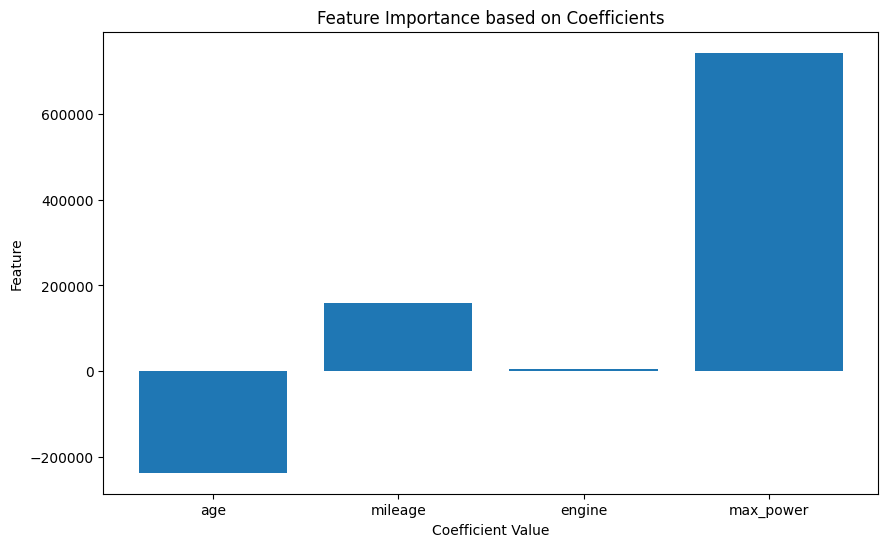

In [170]:
type_of_regression = str_to_class('Lasso')
best_param = {"method": 'sto', 'weight_init':'zero', "momentum":True, "lr": 0.01, "l": 0.1}
mlflow.start_run(run_name=f"method-sto-weight_init-zero-momentum-True-lr-0.01-reg-Lass0", nested=True)
model = type_of_regression(**best_param)  
print(model)
model.fit(X_train, y_train)
yhat = model.predict(X_test)
print(yhat)
mse  = model.mse(yhat, y_test)
r2 = compute_r2(yhat, y_test)
print("Test MSE: ", mse)
print("Test R2: ", r2)
model.plot_feature_importance(['age', 'mileage', 'engine', 'max_power'])
mlflow.log_metric(key="test_mse", value=mse)
signature = mlflow.models.infer_signature(X_train, model.predict(X_train))
mlflow.sklearn.log_model(model, artifact_path='model', signature=signature)
mlflow.end_run()

### Saving the best model

In [172]:
import pickle
filename = './car-price-new.model'
pickle.dump(model, open(filename, 'wb'))

In [173]:
price_model = pickle.load(open('./car-price-new.model', 'rb'))

In [176]:
price_model.predict([np.array([19, 80, 800, 78])])

array([70785628.25596325])